# Plot street networks and routes as interactive web maps
use osmnx to create a Leaflet web map with folium

In [4]:
%matplotlib inline
%cd ..

/media/sunmengnan/F_Disk/TR/gitlab/edge-subdivision


In [2]:
import osmnx as ox, networkx as nx
from IPython.display import IFrame
ox.config(log_console=True, use_cache=True)

In [5]:
is_jupyter = True

if is_jupyter:
    path = 'data/binjiang1.osm'
else:
    path = 'edge-subdivision/data/binjiang1.osm'
    
G = ox.graph_from_file(path,simplify=False)

### Plot street network as an interactive web map¶

In [10]:
import folium


m = folium.Map(location=[45.5236, -122.6750])
m

In [6]:
# plot the street network with folium
graph_map = ox.plot_graph_folium(G, popup_attribute='name', edge_width=2)

In [11]:
graph_map

In [32]:
import matplotlib.cm as cm
import matplotlib.colors as colors
import pandas as pd
%matplotlib inline

# Street network centrality analysis
calculate and visualize how "important" a node or an edge is in a street network by measuring its centrality

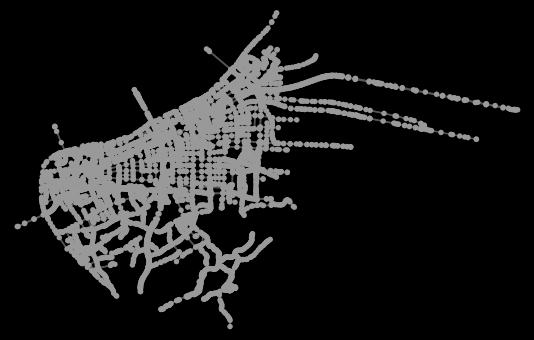

In [33]:
G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, bgcolor='k', node_size=30, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=1.5, edge_alpha=1)

In [34]:
# node closeness centrality
node_centrality = nx.closeness_centrality(G)

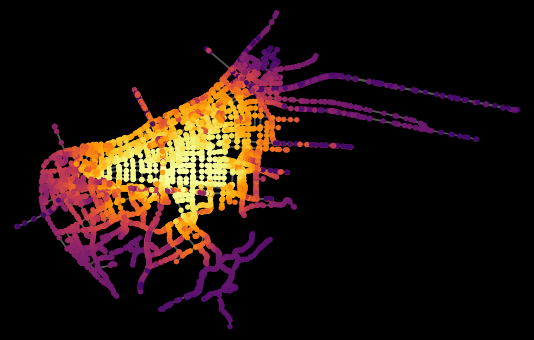

In [38]:
# plot it
df = pd.DataFrame(data=pd.Series(node_centrality).sort_values(), columns=['cc'])
df['colors'] = ox.get_colors(n=len(df), cmap='inferno', start=0.2)
df = df.reindex(G.nodes())
nc = df['colors'].tolist()
fig, ax = ox.plot_graph(G, bgcolor='k', node_size=30, node_color=nc, node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=1.5, edge_alpha=1)